In [1]:
import numpy as np
from scipy.spatial import distance_matrix
import matplotlib.pyplot as plt
from Functions import *
from gaussfft import gaussfft
from PIL import Image
from lab3 import kmeans_segm
from kmeans_example import *
from mean_shift_example import mean_shift_segm,mean_shift_example
from norm_cuts_example import *
from graphcut_example import *

In [4]:
def open_image(path):
    im = Image.open(path)
    im = np.array(im).astype(np.float32)
    return im

In [5]:
ima = open_image('Images-jpg/orange.jpg')
print(ima.shape)

(551, 572, 3)


## Exercise 2 : K-means clustering

In [6]:
def kmeans_segm(image, K, L, seed = 42, early_stopping=False):
    """
    Implement a function that uses K-means to find cluster 'centers'
    and a 'segmentation' with an index per pixel indicating with 
    cluster it is associated to.

    Input arguments:
        image - the RGB input image 
        K - number of clusters
        L - number of iterations
        seed - random seed
    Output:
        segmentation: an integer image with cluster indices
        centers: an array with K cluster mean colors
    """ 
    # Set random seed
    np.random.seed(seed)

    

    # Initialize centers by sampling K different pixels from the image and using their RGB color as the center
    pixel_values = np.reshape(image, (-1, 3))
    centers = set()
    while len(centers) < K:
        center = pixel_values[np.random.choice(pixel_values.shape[0], 1, replace=False)]
        center = tuple(center[0])
        if center not in centers:
            centers.add(center)
    centers = np.array(list(centers))
    new_centers = np.zeros(centers.shape)
    
    # Check if image is 2D or 3D
    if len(image.shape) == 3:
        image_to_segm = np.reshape(image, (-1, 3))
    else:
        image_to_segm = image

    segmentation = np.zeros(image_to_segm.shape[0]*image_to_segm.shape[1]).astype(np.int32)
    # Compute all distances between pixels and cluster centers
    distances = distance_matrix(image_to_segm, centers)
    # Iterate L times
    for i in range(L):
        # Assign each pixel to the cluster center for which the distance is minimum
        new_segmentation = np.argmin(distances, axis=1)
        
        # Check if segmentation has changed
        if np.array_equal(segmentation, new_segmentation) and early_stopping:
            break
        segmentation = new_segmentation

        # Recompute each cluster center by taking the mean of all pixels assigned to it
        for j in range(K):
            centers[j] = np.mean(image_to_segm[segmentation == j], axis=0)
        
        # Recompute all distances between pixels and cluster centers
        distances = distance_matrix(image_to_segm, centers)
    num_iterations = i + 1 

    if (len(image.shape) == 3):
        segmentation = np.reshape(segmentation, image.shape[:2])

    return segmentation, centers, num_iterations

In [ ]:
def image_from_segmentation(segmentation, centers):
    """
    Creates an image from a segmentation and cluster centers.
    """ 
    # get image dimensions
    height, width = segmentation.shape

    # create image from segmentation and centers
    image = np.zeros((height, width, 3))
    for i in range(height):
        for j in range(width):
            image[i, j] = centers[segmentation[i, j]]

    return image

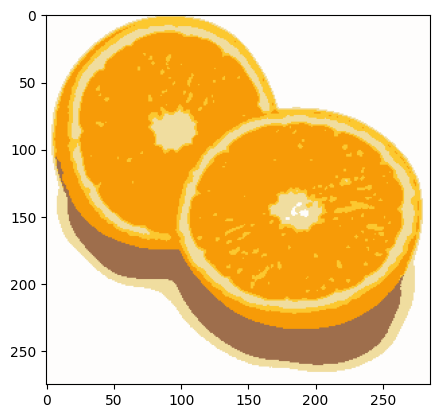

Number of iterations before convergence:  24


In [ ]:
#potrebbe essere incluso in una funzione 
scale_factor = 0.5
image_sigma = 1.0
img = Image.open('Images-jpg/orange.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)


segmentation, centers,num_iterations = kmeans_segm(image=I, K = 5, L=50,early_stopping=True) 
result = image_from_segmentation(segmentation, centers)
result_bytes = np.uint8(result)
plt.imshow(result_bytes)
plt.show()
print('Number of iterations before convergence: ', num_iterations)


KeyboardInterrupt: 

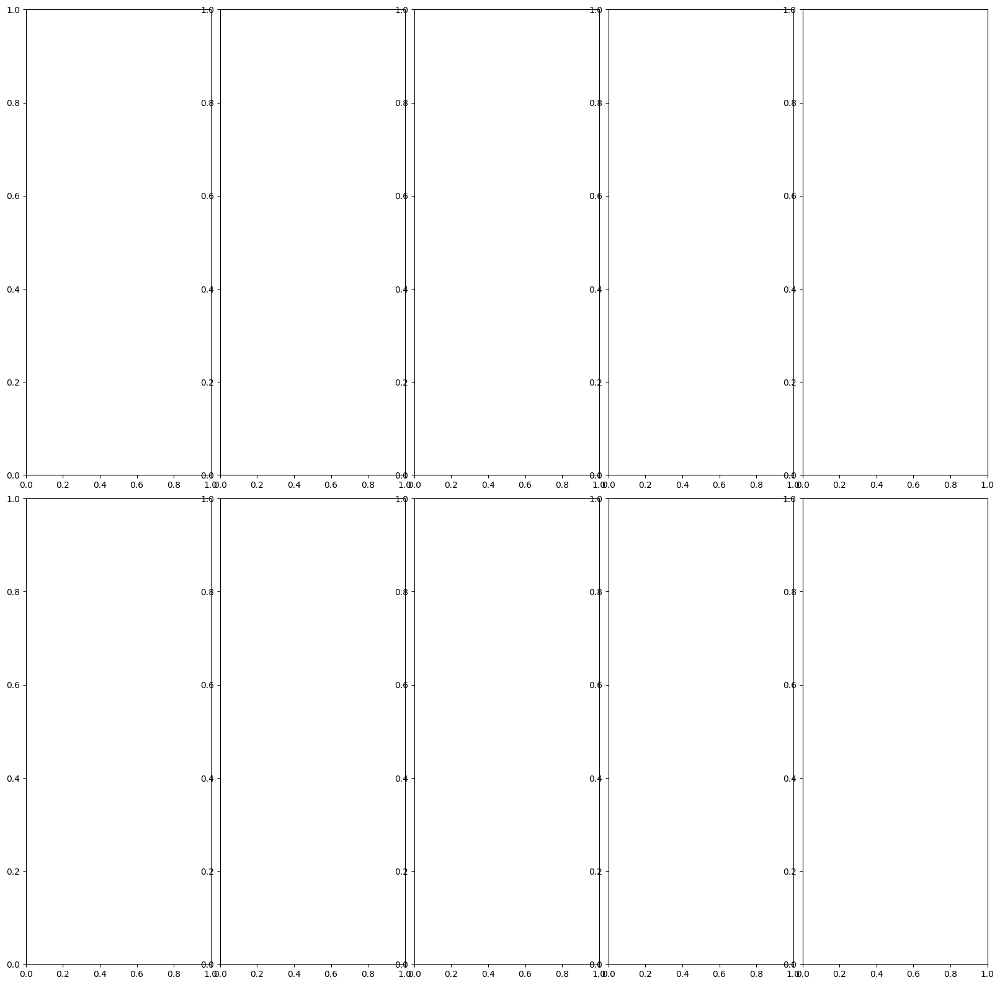

In [ ]:
# Testing different values of K
scale_factor = 0.5
image_sigma=1.0
K_s = [2, 5, 10, 15, 20]
convergence_times =[]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i, K in enumerate(K_s):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers, conv_time = kmeans_segm(image=img, K = K, L=100, early_stopping=True)
    convergence_times.append(conv_time)
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'K = {K}')
    img= Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout(pad=0)
plt.show()

plt.plot(K_s, convergence_times, 'o-')
plt.xlabel('K')
plt.ylabel('Number of iterations')
plt.title('Number of iterations before convergence for different values of K')


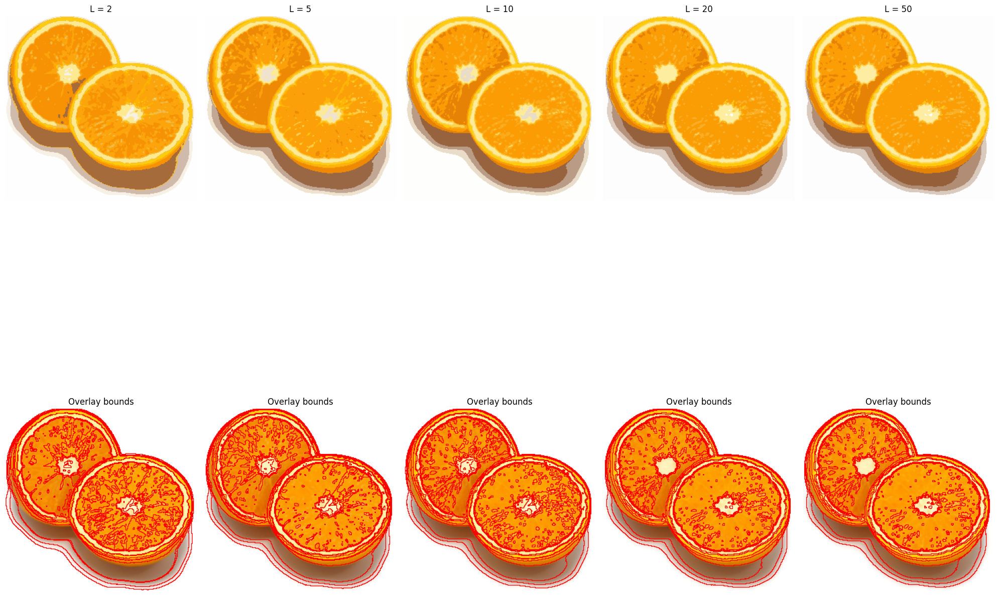

In [ ]:
# Testing different values of L
scale_factor = 0.5
image_sigma=1.0
L_s = [2, 5, 10, 20, 50]
fig, axs = plt.subplots(2, len(L_s), figsize=(20, 20))
for i, l in enumerate(L_s):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 10, L=l) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'L = {l}')
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

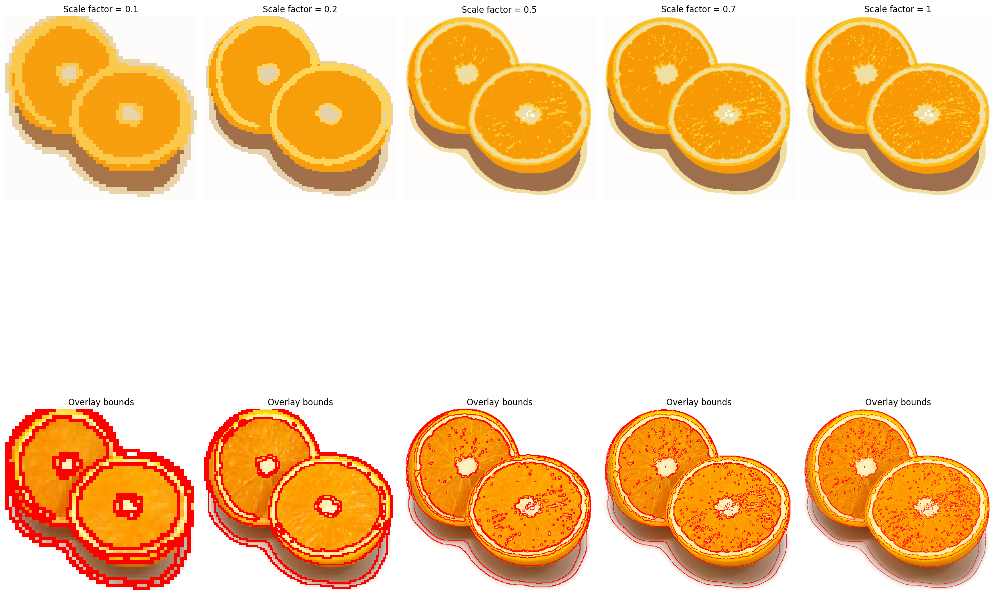

In [ ]:
# Testing different values of scale factor
image_sigma=1.0
scale_factors = [0.1,0.2, 0.5, 0.7, 1]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
for i, scale_factor in enumerate(scale_factors):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 5, L=30) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Scale factor = {scale_factor}')
    img= Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

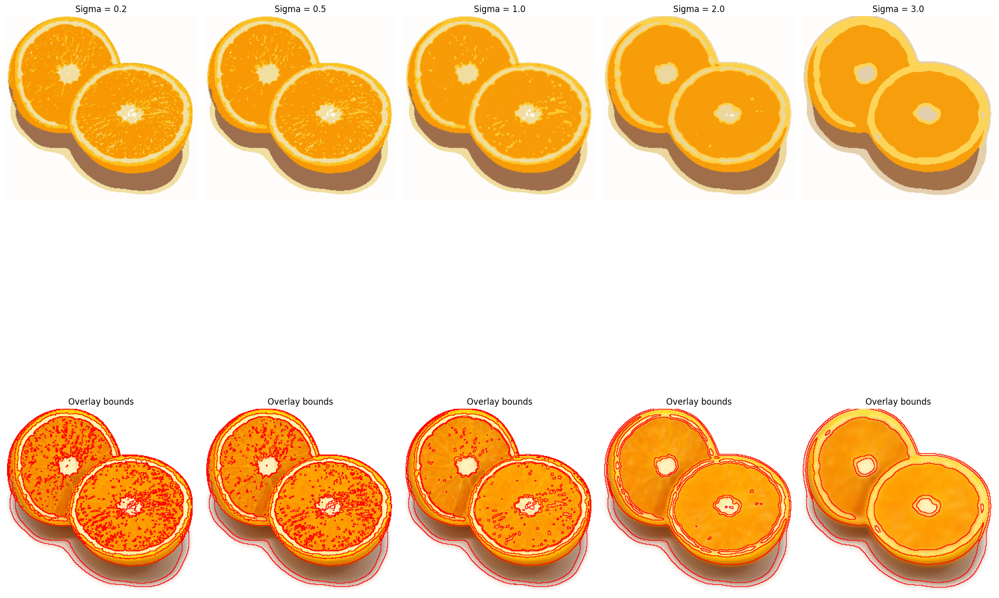

In [ ]:
# Testing different values of sigma
scale_factor = 0.5
sigma_s = [0.2,0.5, 1.0, 2.0, 3.0]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
for i, sigma in enumerate(sigma_s):
    
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img.filter(ImageFilter.GaussianBlur(sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 5, L=30) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Sigma = {sigma}')
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

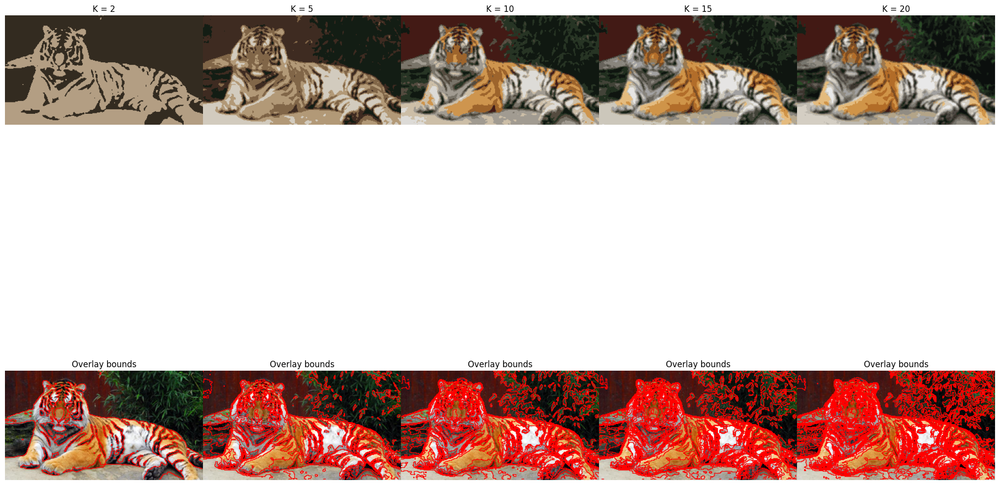

Text(0.5, 1.0, 'Number of iterations before convergence for different values of K')

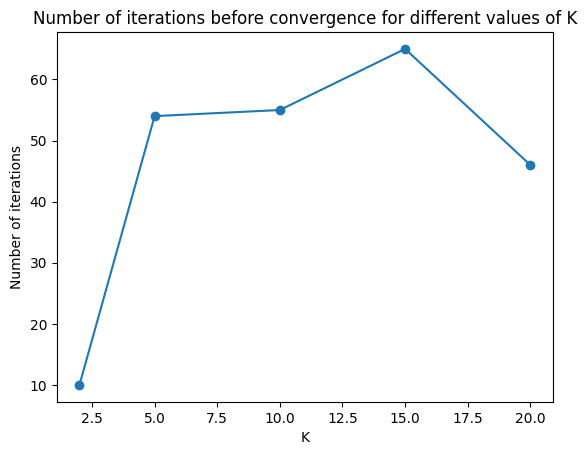

In [ ]:
scale_factor = 0.5
image_sigma=1.0
K_s = [2, 5, 10, 15, 20]
convergence_times =[]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i, K in enumerate(K_s):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers, conv_time = kmeans_segm(image=img, K = K, L=100, early_stopping=True)
    convergence_times.append(conv_time)
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'K = {K}')
    img= Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout(pad=0)
plt.show()

plt.plot(K_s, convergence_times, 'o-')
plt.xlabel('K')
plt.ylabel('Number of iterations')
plt.title('Number of iterations before convergence for different values of K')

## Exercise 3 : Mean-shift segmentation

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


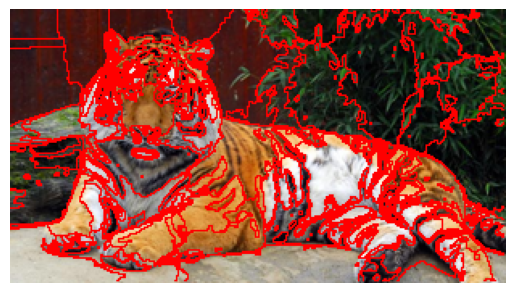

In [ ]:
mean_shift_example()

### Question 5

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


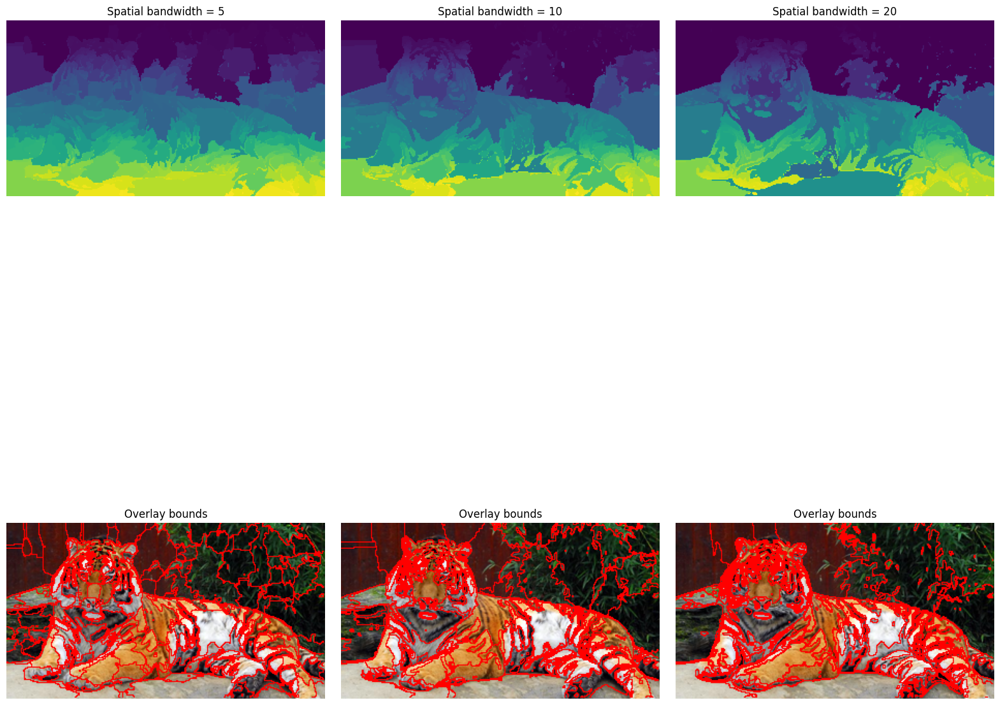

In [ ]:
spatial_bandwidths = [5, 10, 20]
num_iterations = 40
scale_factor = 0.5         # image downscale factor
image_sigma = 1.0          # image preblurring scale
colour_bandwidth = 20.0    # colour bandwidth
num_iterations = 40        # number of mean-shift iterations

fig, axs = plt.subplots(2, len(spatial_bandwidths), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i,spatial_bw in enumerate(spatial_bandwidths):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segm = mean_shift_segm(I, spatial_bw, colour_bandwidth, num_iterations)
    axs[0,i].imshow(segm, cmap='gray')
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Spatial bandwidth = {spatial_bw}')
    axs[1,i].imshow(overlay_bounds(img, segm))
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
plt.show()

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


KeyboardInterrupt: 

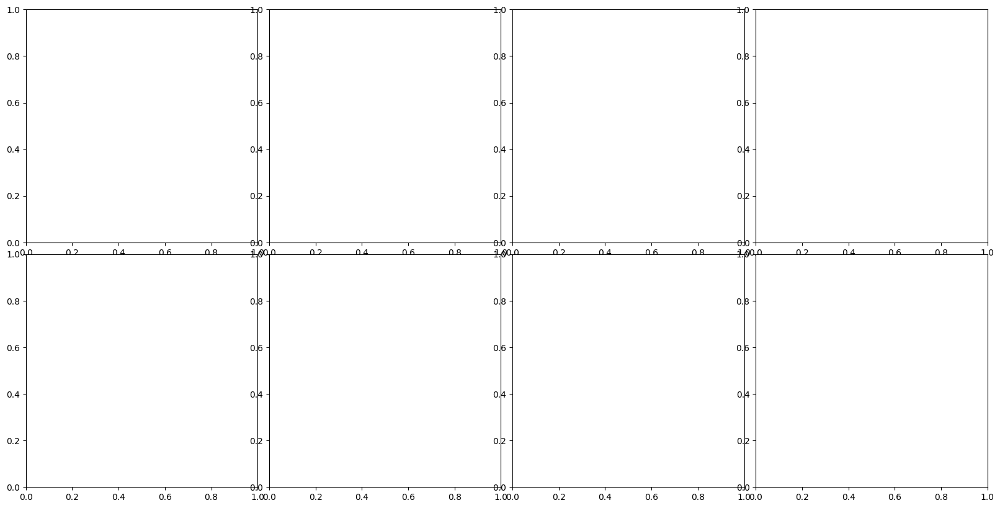

In [ ]:
color_bandwidths = [10, 25, 40, 60]
spatial_bandwidth = 5
num_iterations = 40
scale_factor = 0.5         # image downscale factor
image_sigma = 1.0          # image preblurring scale
num_iterations = 40        # number of mean-shift iterations

fig, axs = plt.subplots(2, len(color_bandwidths), figsize=(20, 10))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i,color_bw in enumerate(color_bandwidths):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segm = mean_shift_segm(I, spatial_bandwidth, color_bw, num_iterations)
    axs[0,i].imshow(segm, cmap='gray')
    axs[0,i].axis('off')
    axs[0,i].set_aspect('equal')
    axs[0,i].set_title(f'Color bandwidth = {color_bw}')
    axs[1,i].imshow(overlay_bounds(img, segm))
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
plt.show()

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


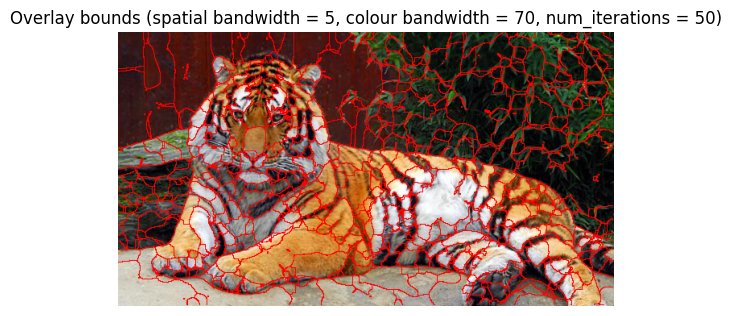

In [ ]:
image_sigma=1.0
spatial_bw = 5
color_bw = 70
num_iterations = 50
img = Image.open('Images-jpg/tiger1.jpg')
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
segm = mean_shift_segm(I=I, spatial_bandwidth=5, colour_bandwidth=70, num_iterations=50)
plt.imshow(overlay_bounds(img, segm))
plt.axis('off')
plt.title('Overlay bounds (spatial bandwidth = {}, colour bandwidth = {}, num_iterations = {})'.format(spatial_bw, color_bw, num_iterations))
plt.show()

### Question 6

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


Text(0.5, 1.0, 'K-Means')

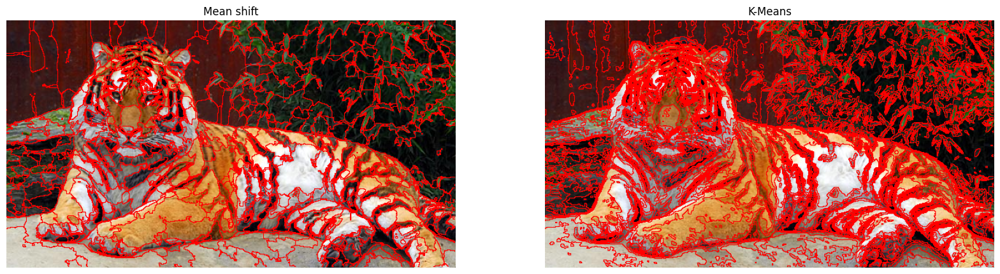

In [ ]:
image_sigma = 1.0
spatial_bandwidth = 5
color_bw = 20
num_iterations = 40
K=15

fig,axs = plt.subplots(1,2, figsize=(20, 10))
original_img = Image.open('Images-jpg/tiger1.jpg')
I = np.asarray(original_img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
segm_mean_shift = mean_shift_segm(I, spatial_bandwidth, color_bw, num_iterations)
axs[0].imshow(overlay_bounds(original_img, segm_mean_shift))
axs[0].axis('off')
axs[0].set_title('Mean shift')

segm_kmeans,_,_ = kmeans_segm(I, K=K, L=num_iterations)
Inew = mean_segments(original_img, segm_kmeans)
Inew = overlay_bounds(original_img, segm_kmeans)
image = Image.fromarray(Inew.astype(np.ubyte))
axs[1].imshow(image)
axs[1].axis('off')
axs[1].set_title('K-Means')

## Exercise 4 : Normalized cut

Compute affinity matrix...
Solve eigenvalue problems to find partitions...


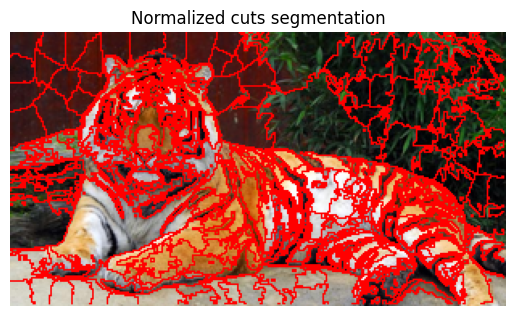

In [ ]:
colour_bandwidth = 20.0  # color bandwidth
radius = 10               # maximum neighbourhood distance
ncuts_thresh = 0.5      # cutting threshold
min_area = 100           # minimum area of segment
max_depth = 15           # maximum splitting depth
scale_factor = 0.5      # image downscale factor
image_sigma = 0.5        # image preblurring scale

image = Image.open('Images-jpg/tiger1.jpg')
image = image.resize((int(image.size[0]*scale_factor), int(image.size[1]*scale_factor)))

    
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(image.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

segmentation = norm_cuts_segm(I, colour_bandwidth, radius, ncuts_thresh, min_area, max_depth)

Inew = mean_segments(image, segmentation)
Inew = overlay_bounds(image, segmentation)

image = Image.fromarray(Inew.astype(np.ubyte))
plt.imshow(image)
plt.axis('off')
plt.title('Normalized cuts segmentation')
plt.show()

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


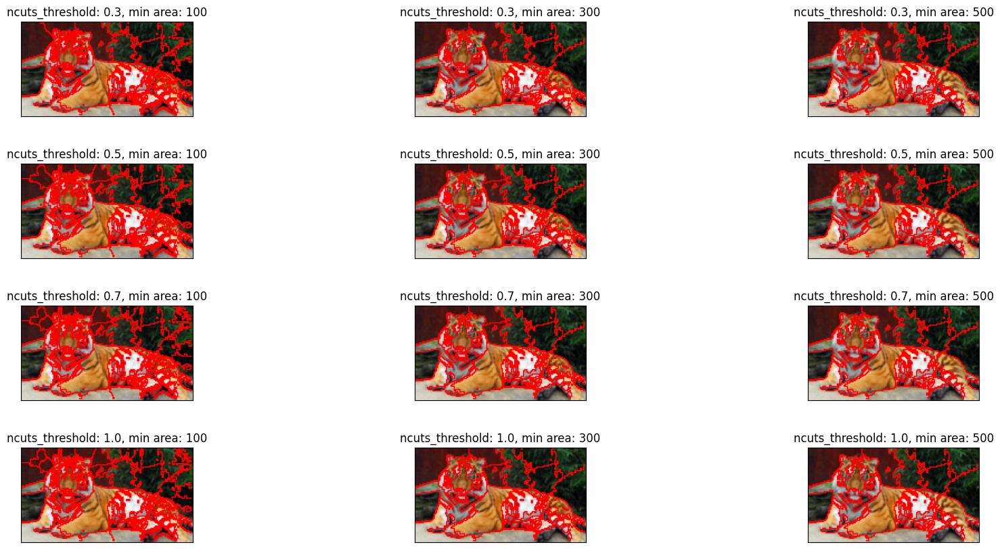

In [ ]:
img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

color_bandwidth = 20
radius = 10
min_area = [100, 300, 500]
ncuts_thresh = [0.3, 0.5, 0.7,1.0]
max_depth = 12
f, ax = plt.subplots(len(ncuts_thresh), len(min_area), figsize=(20, 10))
f.subplots_adjust(hspace=0.5, wspace=0.5)
for i, t in enumerate(ncuts_thresh):
    for j, ma in enumerate(min_area):
        segmentation = norm_cuts_segm(img, color_bandwidth, radius, t, ma, max_depth)
        Inew = overlay_bounds(img, segmentation)
        image = Image.fromarray(Inew.astype(np.ubyte))
        ax[i,j].imshow(image)
        ax[i,j].set_title(f"ncuts_threshold: {t}, min area: {ma}")
        ax[i][j].set_aspect('equal')
        ax[i][j].set_xticklabels([])
        ax[i][j].set_yticklabels([])
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
plt.show()

### Question 10

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


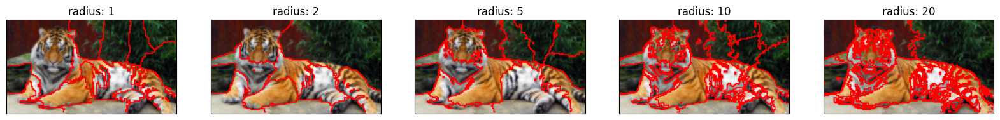

In [ ]:
img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

r_s = [1,2, 5, 10, 20]
ncuts_thresh=0.7
min_area = 500
color_bandwidth = 20
max_depth = 12

f, ax = plt.subplots(1, len(r_s), figsize=(20, 10))

for i,r in enumerate(r_s):
    segmentation = norm_cuts_segm(img, color_bandwidth, r, ncuts_thresh, min_area, max_depth)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    ax[i].imshow(image)
    ax[i].set_title(f"radius: {r}")
    ax[i].set_aspect('equal')
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

## Exercise 5 : Segmentation using graph cuts 

Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100


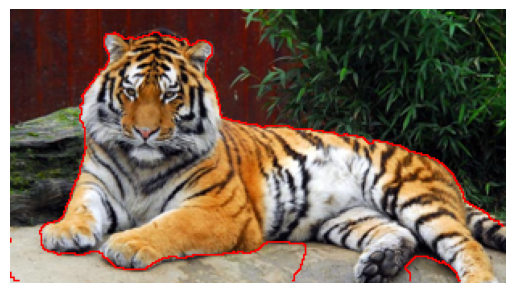

In [2]:
scale_factor = 0.5           # image downscale factor
area = [ 80, 110, 570, 300 ] # image region to train foreground with [ minx, miny, maxx, maxy ]
K = 16                       # number of mixture components
alpha = 15.0                  # maximum edge cost
sigma = 10.0                 # edge cost decay factor

img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))

area = [ int(i*scale_factor) for i in area ]
I = np.asarray(img).astype(np.float32)
segm, prior = graphcut_segm(I, area, K, alpha, sigma)

Inew = mean_segments(img, segm)
if True:
    Inew = overlay_bounds(img, segm)

img = Image.fromarray(Inew.astype(np.ubyte))
plt.imshow(img)
plt.axis('off')
plt.show()

(-0.5, 307.5, 169.5, -0.5)

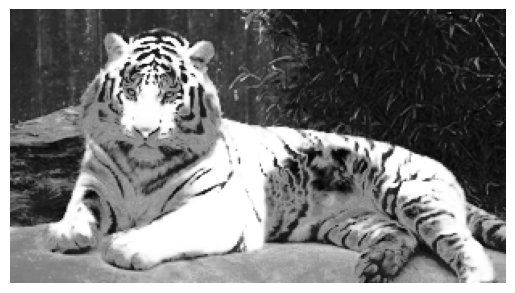

In [7]:
plt.imshow(prior, cmap='gray')
plt.axis('off')